# Project 1. Predicting Walmart Sales

## What is it?
Predicting the weekly sales of Walmart stores based on data from 45 different locations from 2010 to 2012.

## Why was it made?
What's interesting about this project is how none of the factors considered are directly related to store sales/performance, but rather the circumstances of the region in which the stores are located.  

### To that point, the factors considered include:
* The average air temperature in the region [F]
* The cost of fuel in the region [USD/gallon]
* That week's consumer price index [USD]
* The unemployment rate in the region [%]
* Whether a holiday occured in that week
#### Along with engineered factors:
* the month the week happened in
* the week's number within the month
* the week's number within the year
* the differences between the current week's circumstances and the previous week's

Information about which store the data came from was also provided in the dataset, which may help train the model to predict the sales fro that particular store. Though, if the goal was to create a model able to accurately predict sales based only on regional data, such information should be ignored, to improve the model's generalization abilities.

### Project structure
While the main goal was to predict the weekly sales of any store, a store classification model was also trained. As is, the section of the project are:
* Exploratory Data Analysis - considering the distribution of the factors, the correlations between them and judging their usability
* Engineering new date and change-related features, exploring trends, correlations
* Considering different dataset, model and preprocessing choices then testing them on function created in order to speed up experimentation
* Presenting results, judging performance, considering contributors, alternatives
* The classification problem


**To get straight to the point, the results will be presented first, with the development techniques and explorations afterwards**

### Usage:
1. As a **[GitHub Page](https://kakackle.github.io/ml_zoo/predicting_walmar_sales.html)** - enjoy browsing through the results
2. As an **[Interactive notebook](https://github.com/Kakackle/ml_zoo/blob/main/clean_notebooks/predicting_walmart_sales.ipynb)** - with all of the code cells visible, but dynamic plotly charts needed to be re-rendered [note: Cells under "Code Setup" will need to be run for interactive usage of later parts"]

### Code setup

In [1]:
import pandas as pd
import numpy as np

import plotly.express as px
import plotly
from plotly.subplots import make_subplots
import plotly.graph_objects as go

import matplotlib.pyplot as plt
import seaborn as sns

import pendulum

import os

from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import median_absolute_error
from sklearn.pipeline import Pipeline
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import SGDRegressor

# classification
from sklearn.svm import SVC
from sklearn.metrics  import f1_score,accuracy_score, confusion_matrix, classification_report, ConfusionMatrixDisplay

from xgboost import XGBRegressor

In [10]:
# base dataset
df_path  = '../datasets/walmart_sales.csv'
df = pd.read_csv(df_path)

df_noeng = df.copy()

# dataset with engineered features
df_eng_path = '../datasets/walmart_sales_engineered.csv'
df_eng = pd.read_csv(df_eng_path, index_col = 0)

# final / best performing dataset
# with additional information about week number, month AND data about the previous week
# AND the differences between the current and previous week 
df_week_prev_diff = df_eng[['weekly_sales', 'holiday_flag', 'temperature',
       'fuel_price', 'cpi', 'unemployment', 'week_number', 'month',
       'week_of_month', 'prev_temperature',
       'prev_fuel_price', 'prev_cpi', 'prev_unemployment', 'weekly_sales_diff',
       'temperature_diff', 'fuel_price_diff', 'cpi_diff', 'unemployment_diff',
       'prev_holiday_flag', 'holiday_flag_diff', 'prev_month',
       'prev_week_number', 'prev_week_of_month']]

results_df = pd.read_csv('../walmart_sales_results.csv', index_col = 0)
sales_df = pd.read_csv('../walmart_sales_baseline.csv', index_col = 0)

suppress warnings for clarity

In [3]:
import warnings
warnings.filterwarnings('ignore')
# warnings.filterwarnings('error', category=DeprecationWarning)

## Results

### What's in the data?
Before considering training, it is important to explore the relations and distributions present within the data. For that purpose, we can look at the data manually, it's distribution shapes and the correlations between the factors.

As such, a sample of the dataset:

In [4]:
df.sample(5)

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
1938,14,12-08-2011,1928773.82,0,77.00,3.812,186.451211,8.625
2600,19,06-08-2010,1492060.89,0,74.20,2.942,132.614193,8.099
619,5,31-12-2010,298180.18,1,49.79,2.943,211.956714,6.768
3459,25,13-08-2010,686072.39,0,72.73,2.805,204.853378,7.527
4631,33,25-02-2011,242901.21,0,54.89,3.398,128.130000,8.951


The data statistics:

In [5]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Store,6435.0,2.300000e+01,12.988182,1.000,12.000,23.000000,3.400000e+01,4.500000e+01
Weekly_Sales,6435.0,1.046965e+06,564366.622054,209986.250,553350.105,960746.040000,1.420159e+06,3.818686e+06
Holiday_Flag,6435.0,6.993007e-02,0.255049,0.000,0.000,0.000000,0.000000e+00,1.000000e+00
Temperature,6435.0,6.066378e+01,18.444933,-2.060,47.460,62.670000,7.494000e+01,1.001400e+02
Fuel_Price,6435.0,3.358607e+00,0.459020,2.472,2.933,3.445000,3.735000e+00,4.468000e+00
CPI,6435.0,1.715784e+02,39.356712,126.064,131.735,182.616521,2.127433e+02,2.272328e+02
Unemployment,6435.0,7.999151e+00,1.875885,3.879,6.891,7.874000,8.622000e+00,1.431300e+01


And the data distributions plots:

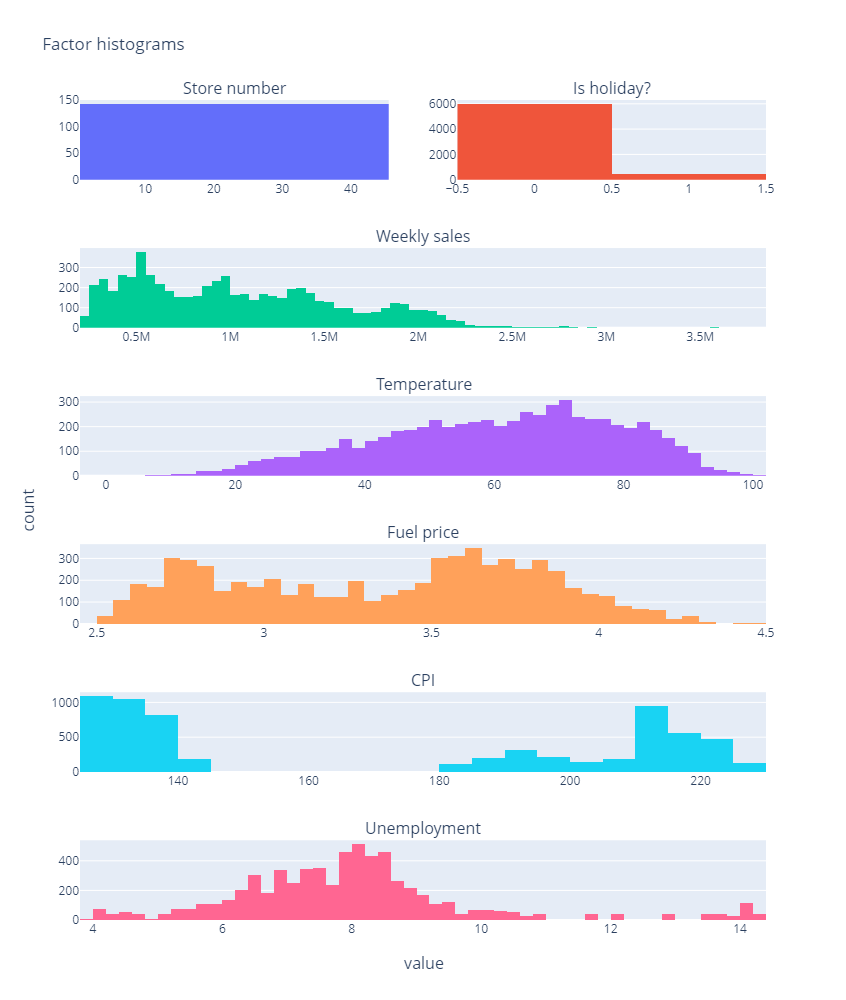

In [6]:
hist_fig = make_subplots(rows = 6, cols = 2,
                        subplot_titles=("Store number", "Is holiday?",
                                        "Weekly sales",
                                        "Temperature",
                                        "Fuel price",
                                        "CPI",
                                        "Unemployment"),
                        specs = [
                            [{}, {}],
                            [{"colspan": 2}, None],
                            [{"colspan": 2}, None],
                            [{"colspan": 2}, None],
                            [{"colspan": 2}, None],
                            [{"colspan": 2}, None],
                        ],
                         x_title = 'value',
                         y_title = 'count'
                        )
hist_fig.add_trace(
    go.Histogram(x=df_eng['store']),
    row=1, col=1
)
hist_fig.add_trace(
    go.Histogram(x=df_eng['holiday_flag']),
    row=1, col=2
)
hist_fig.add_trace(
    go.Histogram(x=df_eng['weekly_sales']),
    row=2, col=1
)
hist_fig.add_trace(
    go.Histogram(x=df_eng['temperature']),
    row=3, col=1
)
hist_fig.add_trace(
    go.Histogram(x=df_eng['fuel_price']),
    row=4, col=1
)
hist_fig.add_trace(
    go.Histogram(x=df_eng['cpi']),
    row=5, col=1
)
hist_fig.add_trace(
    go.Histogram(x=df_eng['unemployment']),
    row=6, col=1
)

hist_fig.update_layout(
    title = "Factor histograms",
    # xaxis_title = "count",
    # yaxis_title = "value",
    height = 1000, width = 1200,
    showlegend=False
)

hist_fig.show()

In [6]:
# hist_fig.write_image("./images/walmart/dist_fig.png")

<!-- ![Distribution figure](images/walmart/dist_fig.png) -->

Note: to see interactive figures (and any like it), uncomment the above cells and run the notebook locally, as there seems to be an issue with the combination github, plotly and notebooks

What conclusions can we reach from these distributions?
* The stores are represented evenly
* Unsurprisingly, the count of days with holidays is greatly smaller than of those without
* The range of weekly sales is quite vast, which might make the training more challenging, but also more robust
* The range of temperatures is also quite vast, which, if chosen as a factor may improve model's robustness
* The distribution of fuel prices may indicate either a sudden change in fuel prices at a point in time within the dataset or a difference between the stores regions
* A much clearer evidence of this may be visible in the Consumer Price Index
* The unemployment rate looks like a hetly distrubution, with a small amount of outliers

For a further exploration of the distribution, particularly for CPI and fuel price, see: **[Exploring the distributions further](#Exploring-the-distributions-further)** later in the notebook

Looking at the relationship matrix of available variables:

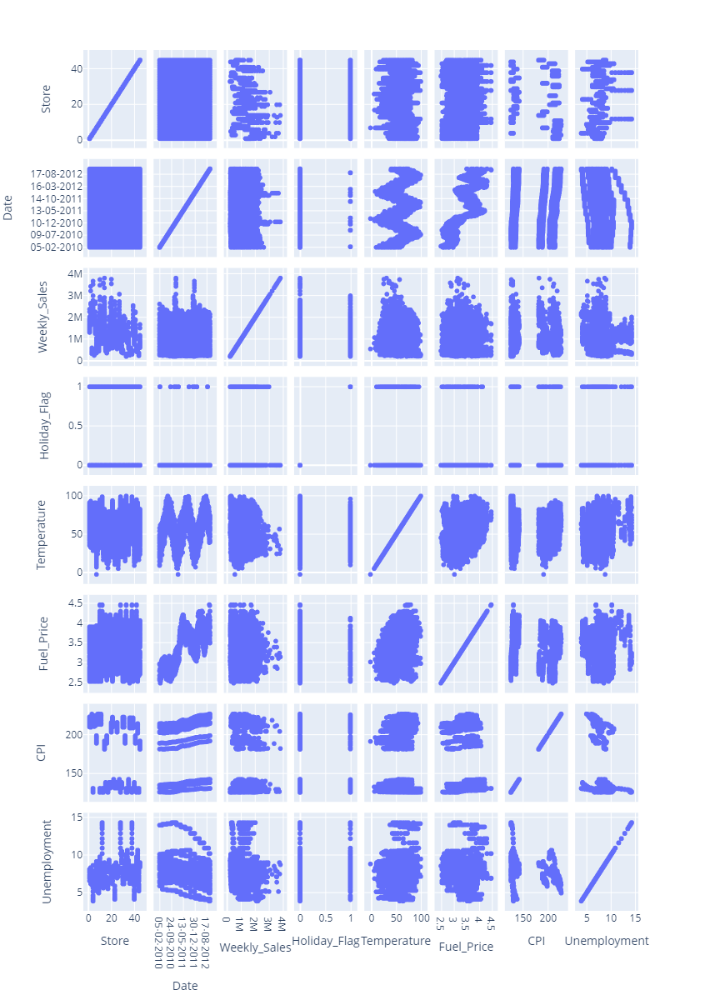

In [8]:
scatter_fig = px.scatter_matrix(df_noeng)
scatter_fig.update_layout(height = 1200, width = 1200)
scatter_fig.show()

<!-- ![Factor scatter figure](images/walmart/scatter_fig.png) -->

* It's rather hard to make any substantial claims about any factor's relation to our predicted variable (weekly sales). No clear linear trends appear.  
* Still, the distribution plots appear more promising, with a healthy amount of variance and not a lot of extreme values for any of the factors.  
* The only possibly suspicious distribution is that of the consumer price index, with a clear distribution split, implying either a change in how it is calculated at some point in time, a sudden change in the US Dollar's value or some other event, which may not fare well for the model's generalizational skills.
* Nevertheless, it will be considrered as one of the factors to include in the prediction, as, how intuition suggests, it should strongly influence consumer spending habits.

### Feature engineering
To understand the exact operations taken in-depth, see **[Datatype cleanup, extra feature engineering](#Datatype-cleanup,-extra-feature-engineering)** further in the notebook.

As a repeat from the introduction, the features added were:
* the month the week happened in
* the week's number within the month
* the week's number within the year
* the differences between the current week's circumstances and the previous week's

With the rationale being:
* The number of the week within a month - may be related to typical salary payoff in the regions of the US. If many customers received their salary in a particualar week, they might spend more on that week or the week after. Conversely, if they haven't received a salary in a while, they might purchase less in general.
* The month - average customer spending could be related to the presence of big holidays within a month, the spending over the year may show cycling tendencies etc.
* The week of the year could show similar tendencies
* The value of the previous week's metrics and the difference between the current and the previous week's values might show tendencies such as whether a change in fuel price, the customer price index or a change in weather could affect customer behaviour

### Regression modelling / predicting weekly sales
To read up more about testing various model and dataset combinations, see **[Weekly sales regression modelling](Weekly-sales-regression-modelling)**. In total, almost 100 models (when considered all hyperparameter and dataset combinations) were tested, out of which one was chosen as the best performant one

In the end the model chosen was a XGBoost model with 2000 estimators and a learning rate of 0.01.

The dataset used for predicting included both the date-related factors as well as the previous week's values and the differences between the current week's and previous values, obviously excluding the difference between current week's sales, but including previous week's sales.

In [11]:
best_model_results = results_df[results_df['model'] == 'xgb_week_prev_diff']
best_model_results

,model,mae,median,r2,score,score_by_max,score_by_min,score_by_mean,score_by_median,score_by_std
19,xgb_week_prev_diff,45318.707146,28028.2550,0.984884,62394.921873,1.63,29.71,5.96,6.49,11.06
47,xgb_week_prev_diff,44516.634006,27577.3225,0.984334,62394.921873,1.63,29.71,5.96,6.49,11.06


#### Measurement metrics

To judge the model, cross-validation across the whole dataset was conducted, as to prevent the accidental change of performance depending on the choice of testing datapoints.

With that, the **score column** represents the averaged mean absolute error cross-validated on the data set, in dollars.

To compare this results, let's look at the results of a baseline decision tree model trained on a dataset with no additional features, as well as the maximum, minimum, average, median and standard deviation values of the weekly sales recorded:

In [12]:
sales_df

,max,min,avg,median,std,model_type,mae_error,mae_by_max,mae_by_min,mae_by_avg,mae_by_median,mae_by_std
0,3818686.45,209986.25,1.046965e+06,960746.04,564366.62,tree_base,407330.46,10.67,193.98,38.91,42.4,72.17


The baseline model achieved an error of around 420k dollars, which constitutes about 40% of the average sales values for all the stores. Not usable by any means.

In contrast, looking at the best performing model's results

A lowest mean absolute error of 43 thousand dollars could prove very useful. When looking at the averaged cross-validation score however, it raises to about 63 thousand, which still is only equal to about 6% of the mean of weekly sales and a measly 1,6% of the maximum recorded sales. Especially considering the premise of this project - how none of the factors directly relate to the store sales, with the closest in theory being the Consumer Price Index.

Futher explorations of the model's performance in relation to input features are presented in [Exploring the predictions / results further](#Exploring-the-predictions-/-results-further)

## Development

### Dataset exploration

#### A quick look

In [10]:
df.sample(5)

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
2365,17,29-07-2011,861894.77,0,68.59,3.574,129.167710,6.745
3254,23,02-03-2012,1322852.20,0,25.91,3.827,137.423897,4.261
2650,19,22-07-2011,1377119.45,0,79.37,3.972,135.873839,7.806
2547,18,27-04-2012,961186.23,0,50.43,4.023,137.978133,8.304
6302,45,16-04-2010,782221.96,0,54.28,2.899,181.692477,8.899


#### Are there any missing values that need to be handled?

In [11]:
df.isnull().sum()

Store           0
Date            0
Weekly_Sales    0
Holiday_Flag    0
Temperature     0
Fuel_Price      0
CPI             0
Unemployment    0
dtype: int64

#### Make column names uniform

In [12]:
df.columns = list(map(lambda col: col.lower().replace(' ', '_'), df.columns))

#### Explore the distribution of the factors within the dataset

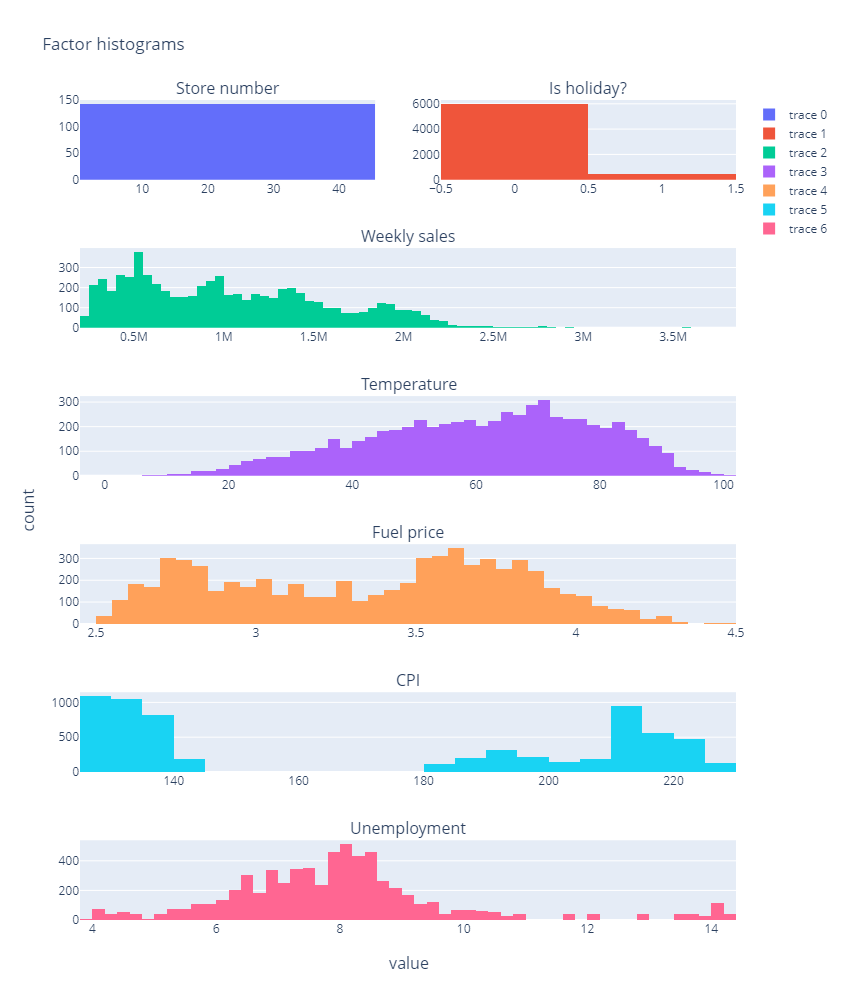

In [13]:
hist_fig = make_subplots(rows = 6, cols = 2,
                        subplot_titles=("Store number", "Is holiday?",
                                        "Weekly sales",
                                        "Temperature",
                                        "Fuel price",
                                        "CPI",
                                        "Unemployment"),
                        specs = [
                            [{}, {}],
                            [{"colspan": 2}, None],
                            [{"colspan": 2}, None],
                            [{"colspan": 2}, None],
                            [{"colspan": 2}, None],
                            [{"colspan": 2}, None],
                        ],
                         x_title = 'value',
                         y_title = 'count'
                        )
hist_fig.add_trace(
    go.Histogram(x=df['store']),
    row=1, col=1
)
hist_fig.add_trace(
    go.Histogram(x=df['holiday_flag']),
    row=1, col=2
)
hist_fig.add_trace(
    go.Histogram(x=df['weekly_sales']),
    row=2, col=1
)
hist_fig.add_trace(
    go.Histogram(x=df['temperature']),
    row=3, col=1
)
hist_fig.add_trace(
    go.Histogram(x=df['fuel_price']),
    row=4, col=1
)
hist_fig.add_trace(
    go.Histogram(x=df['cpi']),
    row=5, col=1
)
hist_fig.add_trace(
    go.Histogram(x=df['unemployment']),
    row=6, col=1
)

hist_fig.update_layout(
    title = "Factor histograms",
    # xaxis_title = "count",
    # yaxis_title = "value",
    height = 1000, width = 1200
)

# for i in range(1,5): 
#     fig['layout']['xaxis{}'.format(i)]['title']='Label X axis 1'
#     fig['layout']['yaxis{}'.format(i)]['title']='Label X axis 2'

# hist_fig.update_layout(autosize=False)

What conclusions can we reach from these distributions?
* The stores are represented evenly
* Unsurprisingly, the count of days with holidays is greatly smaller than of those without
* The range of weekly sales is quite vast, which might make the training more challenging, but also more robust
* The range of temperatures is also quite vast, which, if chosen as a factor may improve model's robustness
* The distribution of fuel prices may indicate either a sudden change in fuel prices at a point in time within the dataset or a difference between the stores regions
* A much clearer evidence of this may be visible in the Consumer Price Index
* The unemployment rate looks like a hetly distrubution, with a small amount of outliers

In [14]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
store,6435.0,2.300000e+01,12.988182,1.000,12.000,23.000000,3.400000e+01,4.500000e+01
weekly_sales,6435.0,1.046965e+06,564366.622054,209986.250,553350.105,960746.040000,1.420159e+06,3.818686e+06
holiday_flag,6435.0,6.993007e-02,0.255049,0.000,0.000,0.000000,0.000000e+00,1.000000e+00
temperature,6435.0,6.066378e+01,18.444933,-2.060,47.460,62.670000,7.494000e+01,1.001400e+02
fuel_price,6435.0,3.358607e+00,0.459020,2.472,2.933,3.445000,3.735000e+00,4.468000e+00
cpi,6435.0,1.715784e+02,39.356712,126.064,131.735,182.616521,2.127433e+02,2.272328e+02
unemployment,6435.0,7.999151e+00,1.875885,3.879,6.891,7.874000,8.622000e+00,1.431300e+01


#### Exploring the distributions further
Looking at the source of the split in fuel price and CPI distrubutions

In [15]:
df_by_date = df.groupby(by=['date'], as_index='False').agg(date = ('date', 'first'), fuel_price = ('fuel_price', 'mean'),
                                                          cpi = ('cpi', 'mean'), unemployment = ('unemployment', 'mean'),
                                                          weekly_sales = ('weekly_sales', 'mean'))

In [16]:
df_by_date.columns

Index(['date', 'fuel_price', 'cpi', 'unemployment', 'weekly_sales'], dtype='object')

C:\Users\User\Desktop\programowanie_web_etc\python_projects\ml_zoo\venv\lib\site-packages\plotly\graph_objs\_deprecations.py:378: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




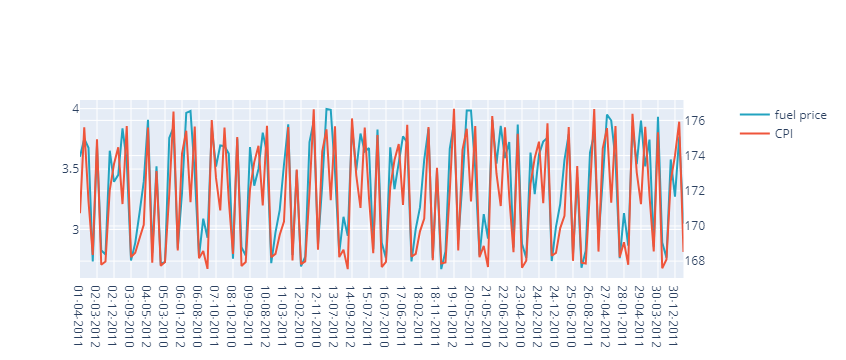

In [17]:
price_date_fig = make_subplots(specs=[[{"secondary_y": True}]])
price_trace = go.Line(
    x=df_by_date['date'],
    y=df_by_date['fuel_price'],
    name = 'fuel price',
    marker = dict(color='rgb(34,163,192)')
)
cpi_trace = go.Line(
    x=df_by_date['date'],
    y=df_by_date['cpi'],
    name = 'CPI',
    yaxis = 'y2'
)
price_date_fig.add_trace(price_trace)
price_date_fig.add_trace(cpi_trace, secondary_y=True)
price_date_fig.show()

There appears to be a very cyclic behaviour of both fuel price and CPI (averaged between stores) with not many  which might explain the distribution split. Before making any conclusions, a look at at the relation between these factors and the store shoud be taken.

In [18]:
df_by_store = df.groupby(by=['store'], as_index='False').agg(store = ('store', 'first'), fuel_price = ('fuel_price', 'mean'),
                                                          cpi = ('cpi', 'mean'), unemployment = ('unemployment', 'mean'),
                                                          weekly_sales = ('weekly_sales', 'mean'))

C:\Users\User\Desktop\programowanie_web_etc\python_projects\ml_zoo\venv\lib\site-packages\plotly\graph_objs\_deprecations.py:378: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




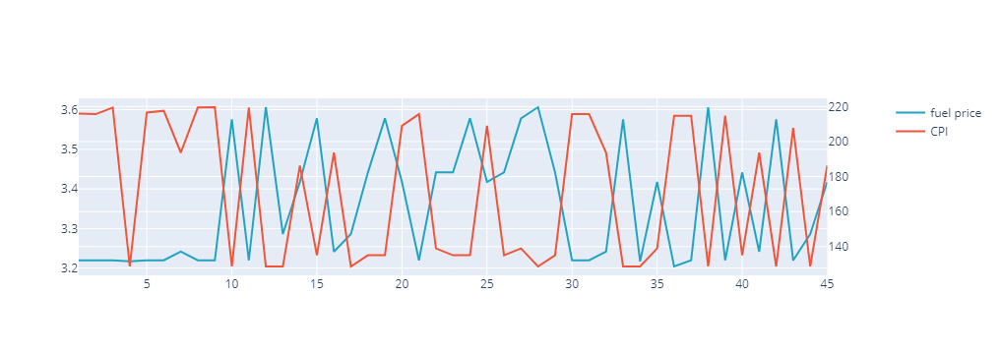

In [19]:
# px.line(df_by_store, x='store', y='fuel_price', title="Fuel price by store")
price_store_fig = make_subplots(specs=[[{"secondary_y": True}]])
price_trace = go.Line(
    x=df_by_store['store'],
    y=df_by_store['fuel_price'],
    name = 'fuel price',
    marker = dict(color='rgb(34,163,192)')
)
cpi_trace = go.Line(
    x=df_by_store['store'],
    y=df_by_store['cpi'],
    name = 'CPI',
    yaxis = 'y2'
)
price_store_fig.add_trace(price_trace)
price_store_fig.add_trace(cpi_trace, secondary_y=True)
price_store_fig.show()

There seems to be a reverse relation between fuel price and customer price index for many of the stores.

In [20]:
df_by_store[df_by_store['cpi'] < 150]['store'].unique().shape

(22,)

In [21]:
df_by_store[df_by_store['fuel_price'] < 3.4]['store'].unique().shape

(24,)

### Factor relationships

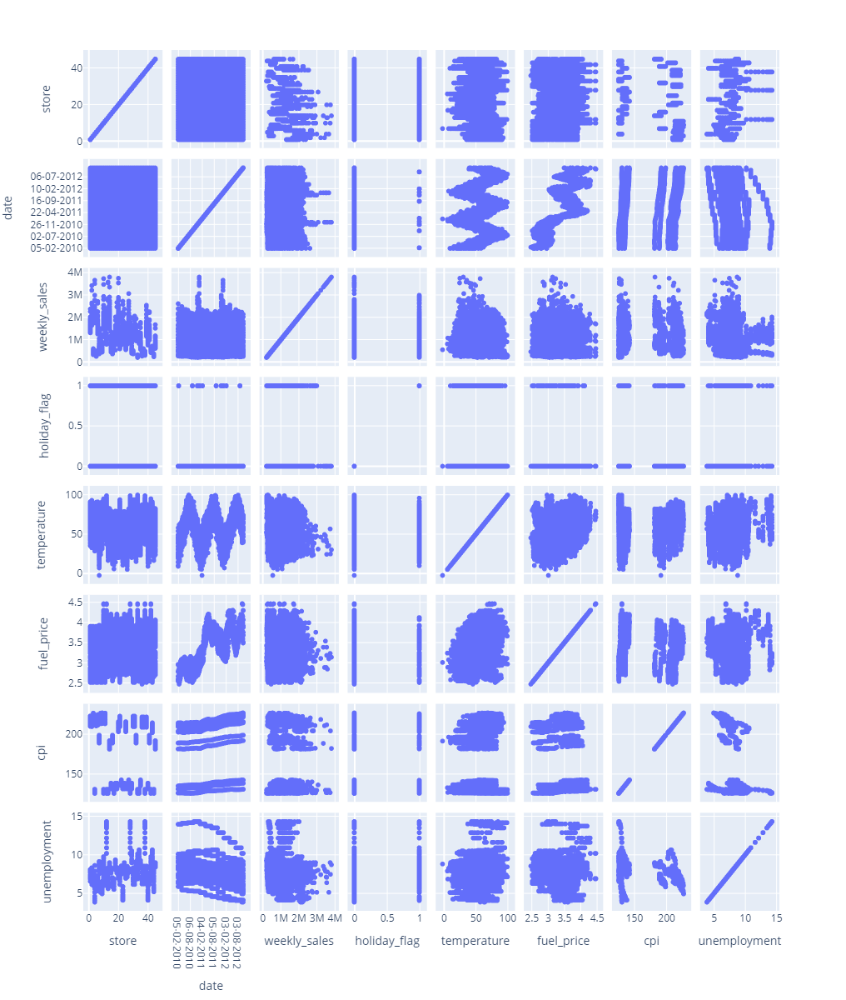

In [22]:
scatter_fig = px.scatter_matrix(df)
scatter_fig.update_layout(height = 1200, width = 1200)
scatter_fig.show()

* It's rather hard to make any substantial claims about any factor's relation to our predicted variable (weekly sales). No clear linear trends appear.  
* Still, the distribution plots appear more promising, with a healthy amount of variance and not a lot of extreme values for any of the factors.  
* The only possibly suspicious distribution is that of the consumer price index, with a clear distribution split, implying either a change in how it is calculated at some point in time, a sudden change in the US Dollar's value or some other event, which may not fare well for the model's generalizational skills.
* Nevertheless, it will be considrered as one of the factors to include in the prediction, as, how intuition suggests, it should strongly influence consumer spending habits.

### Datatype cleanup, extra feature engineering

#### Extra features - week number, month, week of month

In [23]:
df.dtypes
df['date'] = pd.to_datetime(df['date'], format="%d-%m-%Y")

df['week_number'] = df['date'].dt.isocalendar().week
df['month'] = df['date'].dt.month
df['week_of_month'] = df.apply(
    lambda row: pendulum.parse(row['date'].strftime('%Y-%m-%d')).week_of_month,
    axis=1
)

#### Extra features - previous week's values and value changes
Making sure to not overlap values from between stores

In [24]:
df['prev_weekly_sales'] = df.sort_values(['store','date']).groupby(['store'])['weekly_sales'].shift()
df['prev_temperature'] = df.sort_values(['store','date']).groupby(['store'])['temperature'].shift()
df['prev_fuel_price'] = df.sort_values(['store','date']).groupby(['store'])['fuel_price'].shift()
df['prev_cpi'] = df.sort_values(['store','date']).groupby(['store'])['cpi'].shift()
df['prev_unemployment'] = df.sort_values(['store','date']).groupby(['store'])['unemployment'].shift()
df['prev_holiday_flag'] = df.sort_values(['store','date']).groupby(['store'])['holiday_flag'].shift()
df['prev_month'] = df.sort_values(['store','date']).groupby(['store'])['month'].shift()
df['prev_week_number'] = df.sort_values(['store','date']).groupby(['store'])['week_number'].shift()
df['prev_week_of_month'] = df.sort_values(['store','date']).groupby(['store'])['week_of_month'].shift()

# fillna first values of type
df['prev_weekly_sales'] = df['prev_weekly_sales'].fillna(df['weekly_sales'])
df['prev_temperature'] = df['prev_temperature'].fillna(df['temperature'])
df['prev_fuel_price'] = df['prev_fuel_price'].fillna(df['fuel_price'])
df['prev_cpi'] = df['prev_cpi'].fillna(df['cpi'])
df['prev_unemployment'] = df['prev_unemployment'].fillna(df['unemployment'])
df['prev_holiday_flag'] = df['prev_holiday_flag'].fillna(df['holiday_flag'])
df['prev_month'] = df['prev_month'].fillna(df['month'])
df['prev_week_number'] = df['prev_week_number'].fillna(df['week_number'])
df['prev_week_of_month'] = df['prev_week_of_month'].fillna(df['week_of_month'])

Calculate differences from previous week to current

In [25]:
prev_cols = ['weekly_sales', 'temperature', 'fuel_price', 'cpi', 'unemployment', 'holiday_flag']
for col in prev_cols:
    df[f'{col}_diff'] = df[f'{col}'] - df[f'prev_{col}']

In [26]:
# scatter_2_cols = [f'prev_{col}' for col in prev_cols]
# scatter_fig_2 = px.scatter_matrix(df,
#                                  dimensions = scatter_2_cols)
# scatter_fig_2.update_layout(height = 1400, width = 1400)
# scatter_fig_2.show()

#### Date-related factors and weekly sales

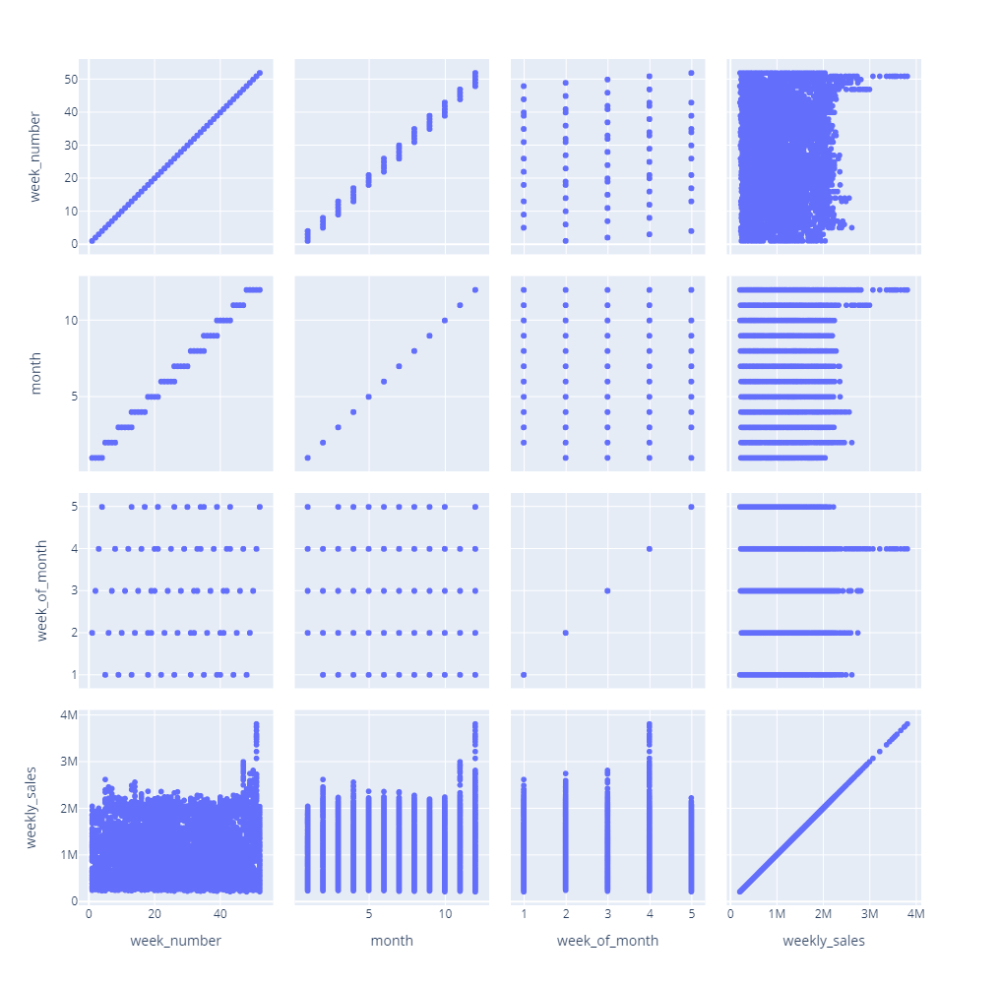

In [27]:
scatter_fig_week = px.scatter_matrix(df,
                                 dimensions = ['week_number', 'month', 'week_of_month', 'weekly_sales'])
scatter_fig_week.update_layout(height = 1000, width = 1000)
scatter_fig_week.show()

It would seem that typically week 4 is the big spender week in many of the stores. A similar rise can be ovserved in months 11 and 12 (november and december), which include both Thanksgiving Day and Christmas Holidays, which can drive up sales. Worth considering is also the following january fall in sales.

### Weekly sales regression modelling
With features prepared and their relationships explored, it may still be unclear how they might contribute to the prediction accuracy. Be it because of their vast variance, clear or unclear trends present in the data or uncaptured, indirect relations between the factors considered.

Even after that, there exists a vast range of techniques and model types that could perform differenly on supplied data, capturing different relations within it.

For those reasons, to make experimentation easier and faster, let's create a few helper functions, to allow for quick dataset, hypermarameter and model type choice swaps.

#### Baseline
Before diving further into exploring, let's establish the metrics against which we can judge model performance, for weekly sales, such a measure could be how the mean or median error of predictions compares to the minimum, maximum, mean and average weekly sale prices present in the dataset

In [28]:
max_sales = df_eng['weekly_sales'].max()
min_sales = df_eng['weekly_sales'].min()
avg_sales = df_eng['weekly_sales'].mean()
median_sales = df_eng['weekly_sales'].median()
std_sales = round(df_eng['weekly_sales'].std(),2)
sales_data = {'max': [max_sales], 'min': [min_sales],
              'avg': [avg_sales], 'median': [median_sales],
             'std': [std_sales]}
sales_df = pd.DataFrame(sales_data)

In [29]:
sales_df

,max,min,avg,median,std
0,3818686.45,209986.25,1.046965e+06,960746.04,564366.62


#### Baseline decision tree model
For a baseline performance, let's use a decision tree model with no hyperparameter tuning, only the base dataset features, no preprocessing and no cross-validation.

In [30]:
X_base = df_eng[['holiday_flag', 'temperature',
       'fuel_price', 'cpi', 'unemployment', 'week_number', 'month',
       'week_of_month']]
y_base = df_eng[['weekly_sales']]

X_base_train, X_base_test, y_base_train, y_base_test = train_test_split(
    X_base, y_base, shuffle=True, train_size=0.8)

tree_model_base = DecisionTreeRegressor()

tree_model_base.fit(X_base_train, y_base_train)

tree_base_preds = tree_model_base.predict(X_base_test)

tree_base_error = mean_absolute_error(y_base_test, tree_base_preds)
tree_base_error

407330.46155400155

In [31]:
sales_df['model_type'] = 'tree_base'
sales_df['mae_error'] = round(tree_base_error,2)
sales_df['mae_by_max'] = round(sales_df['mae_error'] * 100 / sales_df['max'],2)
sales_df['mae_by_min'] = round(sales_df['mae_error'] * 100 / sales_df['min'],2)
sales_df['mae_by_avg'] = round(sales_df['mae_error'] *100 / sales_df['avg'],2)
sales_df['mae_by_median'] = round(sales_df['mae_error'] * 100 / sales_df['median'],2)
sales_df['mae_by_std'] = round(sales_df['mae_error'] * 100 / sales_df['std'],2)

In [32]:
sales_df

,max,min,avg,median,std,model_type,mae_error,mae_by_max,mae_by_min,mae_by_avg,mae_by_median,mae_by_std
0,3818686.45,209986.25,1.046965e+06,960746.04,564366.62,tree_base,407330.46,10.67,193.98,38.91,42.4,72.17


In [33]:
sales_df.to_csv('../walmart_sales_baseline.csv')

With a mean prediction error of ~420k USD, the scale of error is quite large, as it stands as 200% of the minimum sales value and about 40% of mean sales. Making the predictions extremely unpredictable.

### Uniform training function
The function will:
* take in model, dataset, parameters, training options
* scale / preprocess the data if specified
* train model
* cross-validate the model
* return results of mae, r2 score, median_error as a new row of dataframe collecting results from all types of models, datasets etc
* calculate the proportion of error to the max, min, average, median and std of weekly sales

In [109]:
def preprocess_and_train_regression(model, dataset, target_col,
                                    standard_scale=True,
                                    model_name = None):
    print(f'model {model_name} started training')
    
    X = dataset.drop([target_col], axis=1)
    y = dataset[[target_col]]
    X_train, X_valid, y_train, y_valid = train_test_split(X, y.values.ravel(), shuffle=True, train_size=0.8)

    numerical_cols = [cname for cname in X_train.columns if X_train[cname].dtype in ['int64', 'float64',
                                                                                     'UInt32', 'int32']]
    # Preprocessing transformers
    numerical_transformer = StandardScaler()
    
    # combined preprocessor
    preprocessor = ColumnTransformer(
        transformers = [
            ('num', numerical_transformer, numerical_cols),
            # ('cat', categorical_transformer, categorical_cols)
        ]
    )
    
    # Bundle preprocessing and modeling code in a pipeline
    if standard_scale == True:
        train_pipeline = Pipeline(steps=[
            ('preprocessor', preprocessor),
            ('model', model)
        ])
    else:
        train_pipeline = Pipeline(steps=[
            ('model', model)
        ])
    
    # Preprocessing of training data, fit model 
    train_pipeline.fit(X_train, y_train)
    
    # Preprocessing of validation data, get predictions
    preds = train_pipeline.predict(X_valid)
    
    mae = mean_absolute_error(y_valid, preds)
    median = median_absolute_error(y_valid, preds)
    r2 = r2_score(y_valid, preds)

    # cross-validate and average the score
    scores = -1 * cross_val_score(train_pipeline,
                              X, y.values.ravel(),
                              cv=5,
                              scoring='neg_mean_absolute_error')
    score = scores.mean()

    print(f'model {model_name} trained, score: {score}')
    
    return mae, median, score, r2, train_pipeline

In [35]:
def model_results_to_dataframe(mae, median, r2, score, model_name, results_df):
    new_row = {
        'model': model_name,
        'mae': mae,
        'median': median,
        'r2': r2,
        'score': score,
        'score_by_max': round(score * 100 / max_sales,2),
        'score_by_min': round(score * 100 / min_sales,2),
        'score_by_mean': round(score * 100 / avg_sales,2),
        'score_by_median': round(score * 100 / median_sales,2),
        'score_by_std': round(score * 100 / std_sales,2)
    }
    new_df = pd.DataFrame([new_row])
    results_df = pd.concat([results_df, new_df], ignore_index=True)
    
    return results_df

#### Define possible dataset combinations

In [36]:
# the base dataframe information the date
df_noeng = df[['store', 'weekly_sales', 'holiday_flag', 'temperature',
       'fuel_price', 'cpi', 'unemployment']]

# the base dataframe information the date and store
df_noeng_nostore = df[['weekly_sales', 'holiday_flag', 'temperature',
       'fuel_price', 'cpi', 'unemployment']]

# with additional information about week and month
df_week = df[['weekly_sales', 'holiday_flag', 'temperature',
       'fuel_price', 'cpi', 'unemployment', 'week_number', 'month',
       'week_of_month']]

# with additional information about week and month AND data about the previous week
df_week_prev = df[['weekly_sales', 'holiday_flag', 'temperature',
       'fuel_price', 'cpi', 'unemployment', 'week_number', 'month',
       'week_of_month', 'prev_weekly_sales', 'prev_temperature',
       'prev_fuel_price', 'prev_cpi', 'prev_unemployment', 'prev_month',
       'prev_week_number', 'prev_week_of_month']]

# with additional information about week and month AND data about the previous week AND the differences differences
df_week_prev_diff = df[['weekly_sales', 'holiday_flag', 'temperature',
       'fuel_price', 'cpi', 'unemployment', 'week_number', 'month',
       'week_of_month', 'prev_weekly_sales', 'prev_temperature',
       'prev_fuel_price', 'prev_cpi', 'prev_unemployment',
       'temperature_diff', 'fuel_price_diff', 'cpi_diff', 'unemployment_diff',
       'prev_holiday_flag', 'holiday_flag_diff', 'prev_month',
       'prev_week_number', 'prev_week_of_month']]

# with differences, without holiday and temperature - least directly related factors
df_week_prev_diff_no_holiday = df[['weekly_sales',
       'fuel_price', 'cpi', 'unemployment', 'week_number', 'month',
       'week_of_month', 'prev_weekly_sales',
       'prev_fuel_price', 'prev_cpi', 'prev_unemployment',
        'fuel_price_diff', 'cpi_diff', 'unemployment_diff',
        'prev_month',
       'prev_week_number', 'prev_week_of_month']]

df_week_prev_diff_store = df[['store', 'weekly_sales', 'holiday_flag', 'temperature',
       'fuel_price', 'cpi', 'unemployment', 'week_number', 'month',
       'week_of_month', 'prev_weekly_sales', 'prev_temperature',
       'prev_fuel_price', 'prev_cpi', 'prev_unemployment',
       'temperature_diff', 'fuel_price_diff', 'cpi_diff', 'unemployment_diff',
       'prev_holiday_flag', 'holiday_flag_diff', 'prev_month',
       'prev_week_number', 'prev_week_of_month']]

In [37]:
datasets = [df_noeng, df_noeng_nostore,
            df_week, df_week_prev,
            df_week_prev_diff, df_week_prev_diff_no_holiday,
            df_week_prev_diff_store]
dataset_names = ['noeng', 'noeng_nostore',
                 'week', 'week_prev',
                 'week_prev_diff', 'week_prev_diff_no_holiday',
                 'week_prev_diff_store']

### Decision Tree models
Let's try tuning tree models by setting the maximum leaf nodes, as setting the maximum depth, will stop only at that depth, whilst choosing a maximum number of leaf nodes will try to optimize for best results and potentially drop some branches and reach a further overall depth.

For baseline tree model performance, only the base dataset will be used.

In [38]:
def get_tree_mae(max_leaf_nodes, train_X, val_X, train_y, val_y):
    model = DecisionTreeRegressor(max_leaf_nodes = max_leaf_nodes)
    model.fit(train_X, train_y)
    preds_val = model.predict(val_X)
    mae = mean_absolute_error(val_y, preds_val)
    return mae

In [39]:
best_base_tree_mae = tree_base_error
for max_leaf_nodes in [5, 50, 200, 250, 350, 500, 1000, 1750, 2500, 5000]:
    leaf_mae = get_tree_mae(max_leaf_nodes, X_base_train, X_base_test, y_base_train, y_base_test)
    if leaf_mae < best_base_tree_mae:
        best_base_tree_mae = leaf_mae
    print(f'Max leaf nodes: {max_leaf_nodes}, MAE Error: {leaf_mae}')

Max leaf nodes: 5, MAE Error: 457452.490810993
Max leaf nodes: 50, MAE Error: 388297.4889768926
Max leaf nodes: 200, MAE Error: 334513.0288046381
Max leaf nodes: 250, MAE Error: 331655.10642164515
Max leaf nodes: 350, MAE Error: 337170.3925875377
Max leaf nodes: 500, MAE Error: 352344.10878721357
Max leaf nodes: 1000, MAE Error: 386410.2587788944
Max leaf nodes: 1750, MAE Error: 408961.7812092063
Max leaf nodes: 2500, MAE Error: 406427.8777142688
Max leaf nodes: 5000, MAE Error: 402622.1923983424


#### Max leaf nodes set as 200

#### Quickly assess the datasets

In [40]:
def assess_sales_dataset_tree(input_df):
    input_X = input_df.drop(['weekly_sales'], axis=1)
    input_y = input_df[['weekly_sales']]
    X_train, X_test, y_train, y_test = train_test_split(input_X, input_y, shuffle=True, train_size=0.8)
    model = DecisionTreeRegressor(max_leaf_nodes = 200)
    model.fit(X_train, y_train)
    preds = model.predict(X_test)
    mae = mean_absolute_error(y_test, preds)
    return mae

In [41]:
best_tree_dataset_mae = df[['weekly_sales']].max().values[0]
for df_index, dataset in enumerate(datasets):
    df_mae = assess_sales_dataset_tree(dataset)
    if df_mae < best_tree_dataset_mae:
        best_tree_dataset_mae = df_mae
    print(f'df: {dataset_names[df_index]}, MAE Error: {df_mae}')

df: noeng, MAE Error: 85575.07687713197
df: noeng_nostore, MAE Error: 342137.1568076557
df: week, MAE Error: 362853.3747665065
df: week_prev, MAE Error: 58572.653681035285
df: week_prev_diff, MAE Error: 66567.47175256797
df: week_prev_diff_no_holiday, MAE Error: 68478.39775016108
df: week_prev_diff_store, MAE Error: 62513.83436315416


### Clearly, using the previous week information yields the best results
* What's interesting is how the removal of the 'store' information, had terrible consequences. Perhaps it is unsurprising - information about which store you are considering will probably strongly influence the sales prediction, as can be seen in the weekly sales distribution, which has quite a large range.
* The question is - do we want to use this information, for most accurate results or do we want to ignore it, to make the model more general and applicable to any store not present in the dataset, but rather limiting ourselves to only data about the region such potential store would reside in.

### Be warned - data leakage danger
* To calculate the difference between previous week's sales and the current - you'd need current week's sales - which is why, it was important to remove this column from the datasets
* It might also be interesting to consider predicting without definitive weekly differences (as in being future-oriented) or with these values

### XGBoost
Taking in our best perfoming dataset and using it with a more mathematically complex model, let's test for hyperparameter combinations

In [42]:
X = df_week_prev.drop(['weekly_sales'], axis=1)
y = df_week_prev[['weekly_sales']]
X_train, X_test, y_train, y_test = train_test_split(X, y.values.ravel(), shuffle=True, train_size=0.8)

In [43]:
def get_xgb_mae(n_estimators, learning_rate, train_X, val_X, train_y, val_y, early_stopping_rounds = 5):
    model = XGBRegressor(n_estimators = n_estimators, learning_rate=learning_rate)
    model.fit(train_X, train_y,
             early_stopping_rounds=early_stopping_rounds,
             eval_set=[(val_X, val_y)],
             verbose=False)
    preds_val = model.predict(val_X)
    mae = mean_absolute_error(val_y, preds_val)
    return mae

#### Commented for sake of rerunning - intermediary step

In [44]:
# best_xgb_mae = y_train.max()
# for n_estimators in [100, 250, 500, 1000, 2000, 5000]:
#     for learning_rate in [0.001, 0.01, 0.02, 0.05, 0.1]:
#         xgb_mae = get_xgb_mae(n_estimators, learning_rate, X_train, X_test, y_train, y_test)
#         if xgb_mae < best_xgb_mae:
#             best_xgb_mae = xgb_mae
#         print(f'n_estimators: {n_estimators}, learning_rate: {learning_rate}, MAE Error: {xgb_mae}')

#### Best XGB model: n_estimators = 2000, learning_rater = 0.01

### SVR, SGDRegressor and good ol' LinearRegression

In [45]:
from sklearn.svm import SVR
svr_model = SVR()
svr_model.fit(X_train, y_train)
svr_preds = svr_model.predict(X_test)
svr_mae = mean_absolute_error(svr_preds, y_test)
svr_mae

472662.50840315357

In [46]:
from sklearn.linear_model import LinearRegression
svr_model = LinearRegression()
svr_model.fit(X_train, y_train)
svr_preds = svr_model.predict(X_test)
svr_mae = mean_absolute_error(svr_preds, y_test)
svr_mae

88194.75565251504

In [47]:
from sklearn.linear_model import SGDRegressor
svr_model = SGDRegressor()
svr_model.fit(X_train, y_train)
svr_preds = svr_model.predict(X_test)
svr_mae = mean_absolute_error(svr_preds, y_test)
svr_mae

1.3392158634442775e+20

Interestlingly, the simplest LinearRegression model performed quite well, while a stochastic gradient regressor got completely lost.

### Using the uniform training function

#### prepare the models table

In [118]:
tree_model = DecisionTreeRegressor(max_leaf_nodes=200)
random_forest_model = RandomForestRegressor()
linear_model = LinearRegression()
xgb_model = XGBRegressor(n_estimators=2000, learning_rate=0.01)

models = [tree_model, random_forest_model, linear_model, xgb_model]
model_names = ['tree', 'random_forest', 'linear', 'xgb']

In [122]:
results_df = pd.DataFrame()
max_sales = df_eng['weekly_sales'].max()
min_sales = df_eng['weekly_sales'].min()
avg_sales = df_eng['weekly_sales'].mean()
median_sales = df_eng['weekly_sales'].median()
std_sales = round(df_eng['weekly_sales'].std(),2)

### Warning - lenghty operation - commented for sake of rerunning

In [132]:
score_best = df_eng['weekly_sales'].max()
best_model = None
for d_index, dataset in enumerate(datasets):
    for m_index, model in enumerate(models):
        model_name = f'{model_names[m_index]}_{dataset_names[d_index]}'

        # reset the models
        tree_model = DecisionTreeRegressor(max_leaf_nodes=200)
        random_forest_model = RandomForestRegressor()
        linear_model = LinearRegression()
        xgb_model = XGBRegressor(n_estimators=2000, learning_rate=0.01)
        
        mae, median, score, r2, result_model = preprocess_and_train_regression(model = model,
                                        dataset = dataset,
                                        target_col = 'weekly_sales',
                                        standard_scale=True,
                                        model_name = model_name
                                       )
        results_df = model_results_to_dataframe(mae, median, r2, score, model_name, results_df)

        if score < score_best:
            best_model = result_model

model tree_noeng started training
model tree_noeng trained, score: 595296.90074159
model random_forest_noeng started training
model random_forest_noeng trained, score: 548620.7537072105
model linear_noeng started training
model linear_noeng trained, score: 469524.0295420152
model xgb_noeng started training
model xgb_noeng trained, score: 536853.2874361888
model tree_noeng_nostore started training
model tree_noeng_nostore trained, score: 727987.4202729956
model random_forest_noeng_nostore started training
model random_forest_noeng_nostore trained, score: 704653.6401096077
model linear_noeng_nostore started training
model linear_noeng_nostore trained, score: 499858.3530696604
model xgb_noeng_nostore started training
model xgb_noeng_nostore trained, score: 675775.4092566705
model tree_week started training
model tree_week trained, score: 733433.8645438107
model random_forest_week started training
model random_forest_week trained, score: 690858.4305932797
model linear_week started training

In [51]:
# dataset_names

In [52]:
# mae, median, score, r2, model = preprocess_and_train_regression(model = xgb_model,
#                                 dataset = df_week_prev,
#                                 target_col = 'weekly_sales',
#                                 standard_scale=True,
#                                 model_name = 'xgb_week_prev'
#                                )

In [53]:
# results_df = model_results_to_dataframe(mae, median, r2, score, 'xgb_week_prev', results_df)

In [133]:
results_df

,model,mae,median,r2,score,score_by_max,score_by_min,score_by_mean,score_by_median,score_by_std
0,tree_noeng,84528.038441,49047.070625,0.909809,583240.541650,15.27,277.75,55.71,60.71,103.34
1,random_forest_noeng,75610.881902,37999.522400,0.930984,543197.222052,14.22,258.68,51.88,56.54,96.25
2,linear_noeng,432978.470718,393082.532723,0.155198,469524.029542,12.30,223.60,44.85,48.87,83.19
3,xgb_noeng,69251.615637,40109.565000,0.949283,536853.287436,14.06,255.66,51.28,55.88,95.12
4,tree_noeng_nostore,346101.347530,237083.921275,0.235136,727131.555843,19.04,346.28,69.45,75.68,128.84
5,random_forest_noeng_nostore,392013.727342,277347.167500,0.094972,705502.075501,18.47,335.98,67.39,73.43,125.01
6,linear_noeng_nostore,459003.152820,453239.231604,0.024257,499858.353070,13.09,238.04,47.74,52.03,88.57
7,xgb_noeng_nostore,361764.379940,286374.870000,0.237352,675775.409257,17.70,321.82,64.55,70.34,119.74
8,tree_week,339520.149355,252827.462414,0.287367,736816.914712,19.30,350.89,70.38,76.69,130.56
9,random_forest_week,398005.335912,265231.155650,0.027922,695067.244252,18.20,331.01,66.39,72.35,123.16


In [134]:
results_df.to_csv('../walmart_sales_results.csv')

In [135]:
results_df.sort_values(by=['mae'], ascending=True).head()

,model,mae,median,r2,score,score_by_max,score_by_min,score_by_mean,score_by_median,score_by_std
55,xgb_week_prev_diff_store,41085.150129,25151.43125,0.985960,67456.066304,1.77,32.12,6.44,7.02,11.95
15,xgb_week_prev,42243.329593,27601.76500,0.986700,64512.623049,1.69,30.72,6.16,6.71,11.43
23,xgb_week_prev_diff_no_holiday,44215.133311,27247.98250,0.984934,64371.132537,1.69,30.65,6.15,6.70,11.41
47,xgb_week_prev_diff,44516.634006,27577.32250,0.984334,62394.921873,1.63,29.71,5.96,6.49,11.06
51,xgb_week_prev_diff_no_holiday,45099.909304,28315.09000,0.984759,64371.132537,1.69,30.65,6.15,6.70,11.41


In [136]:
results_df.sort_values(by=['score'], ascending=True).head()

,model,mae,median,r2,score,score_by_max,score_by_min,score_by_mean,score_by_median,score_by_std
47,xgb_week_prev_diff,44516.634006,27577.32250,0.984334,62394.921873,1.63,29.71,5.96,6.49,11.06
19,xgb_week_prev_diff,45318.707146,28028.25500,0.984884,62394.921873,1.63,29.71,5.96,6.49,11.06
51,xgb_week_prev_diff_no_holiday,45099.909304,28315.09000,0.984759,64371.132537,1.69,30.65,6.15,6.70,11.41
23,xgb_week_prev_diff_no_holiday,44215.133311,27247.98250,0.984934,64371.132537,1.69,30.65,6.15,6.70,11.41
43,xgb_week_prev,46000.865875,27596.50625,0.981093,64512.623049,1.69,30.72,6.16,6.71,11.43


A lowest mean absolute error of 43 thousand dollars is very impressive indeed. When looking at the averaged cross-validation score however, it raises to about 63 thousand, which still is only equal to about 6% of the mean of weekly sales and a measly 1,6% of the maximum recorded sales. Especially considering the premise of this project - how none of the factors directly relate to the store sales, with the closest in theory being the Consumer Price Index.

In [137]:
best_model_results = results_df[results_df['model'] == 'xgb_week_prev_diff']

### Exploring the predictions / results further
* Are there any stores the model performs better or worse on?
* Are good or bad predictions related to some of the factors?
* 

In [87]:
# using the dataset with store information for additional grouping for analysis, but training without it
df_week_prev_diff_store

,store,weekly_sales,holiday_flag,temperature,fuel_price,cpi,unemployment,week_number,month,week_of_month,...,prev_unemployment,temperature_diff,fuel_price_diff,cpi_diff,unemployment_diff,prev_holiday_flag,holiday_flag_diff,prev_month,prev_week_number,prev_week_of_month
0,1,1643690.90,0,42.31,2.572,211.096358,8.106,5,2,1,...,8.106,0.00,0.000,0.000000,0.000,0.0,0.0,2.0,5,1.0
1,1,1641957.44,1,38.51,2.548,211.242170,8.106,6,2,2,...,8.106,-3.80,-0.024,0.145812,0.000,0.0,1.0,2.0,5,1.0
2,1,1611968.17,0,39.93,2.514,211.289143,8.106,7,2,3,...,8.106,1.42,-0.034,0.046973,0.000,1.0,-1.0,2.0,6,2.0
3,1,1409727.59,0,46.63,2.561,211.319643,8.106,8,2,4,...,8.106,6.70,0.047,0.030500,0.000,0.0,0.0,2.0,7,3.0
4,1,1554806.68,0,46.50,2.625,211.350143,8.106,9,3,1,...,8.106,-0.13,0.064,0.030500,0.000,0.0,0.0,2.0,8,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6430,45,713173.95,0,64.88,3.997,192.013558,8.684,39,9,5,...,8.684,-0.44,-0.041,0.156854,0.000,0.0,0.0,9.0,38,4.0
6431,45,733455.07,0,64.89,3.985,192.170412,8.667,40,10,1,...,8.684,0.01,-0.012,0.156854,-0.017,0.0,0.0,9.0,39,5.0
6432,45,734464.36,0,54.47,4.000,192.327265,8.667,41,10,2,...,8.667,-10.42,0.015,0.156854,0.000,0.0,0.0,10.0,40,1.0
6433,45,718125.53,0,56.47,3.969,192.330854,8.667,42,10,3,...,8.667,2.00,-0.031,0.003589,0.000,0.0,0.0,10.0,41,2.0


In [139]:
best_model

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num', StandardScaler(),
                                                  ['store', 'holiday_flag',
                                                   'temperature', 'fuel_price',
                                                   'cpi', 'unemployment',
                                                   'week_number', 'month',
                                                   'week_of_month',
                                                   'prev_weekly_sales',
                                                   'prev_temperature',
                                                   'prev_fuel_price',
                                                   'prev_cpi',
                                                   'prev_unemployment',
                                                   'temperature_diff',
                                                   'fuel_price_diff',
                                                   'cpi_diff',
                                                   'unemployment_di...
                              feature_types=None, gamma=None, grow_policy=None,
                              importance_type=None,
                              interaction_constraints=None, learning_rate=0.01,
                              max_bin=None, max_cat_threshold=None,
                              max_cat_to_onehot=None, max_delta_step=None,
                              max_depth=None, max_leaves=None,
                              min_child_weight=None, missing=nan,
                              monotone_constraints=None, multi_strategy=None,
                              n_estimators=2000, n_jobs=None,
                              num_parallel_tree=None, random_state=None, ...))])

In [142]:
import pickle
best_model_pickle = pickle.dumps(best_model)

#### Testing the best performing model on a random sample

In [145]:
test_sample = df_week_prev_diff_store.sample(frac=0.2)
X = test_sample.drop(['weekly_sales'], axis=1)
y = test_sample[['weekly_sales']]
# X_train, X_test, y_train, y_test = train_test_split(X, y, shuffle=True, train_size=0.8)

In [147]:
test_sample['predicted_sales'] = best_model.predict(X)

In [148]:
test_sample['error'] = abs(test_sample['weekly_sales'] - test_sample['predicted_sales'])

In [149]:
test_sample.columns

Index(['store', 'weekly_sales', 'holiday_flag', 'temperature', 'fuel_price',
       'cpi', 'unemployment', 'week_number', 'month', 'week_of_month',
       'prev_weekly_sales', 'prev_temperature', 'prev_fuel_price', 'prev_cpi',
       'prev_unemployment', 'temperature_diff', 'fuel_price_diff', 'cpi_diff',
       'unemployment_diff', 'prev_holiday_flag', 'holiday_flag_diff',
       'prev_month', 'prev_week_number', 'prev_week_of_month',
       'predicted_sales', 'error'],
      dtype='object')

#### Grouping the sample results by store
Can we learn some insights about which feature contributed the most to the error? Or what kind of stores (by regional metrics) does our model excel in predicting values for or struggle with?

In [150]:
test_sample_by_store = test_sample.groupby(['store'], as_index=False).agg(
    store = ('store', 'first'),
    average_error = ('error', 'mean'),
    average_sales = ('weekly_sales', 'mean'),
    average_prediction = ('predicted_sales', 'mean'),
    average_temp = ('temperature', 'mean'),
    average_fuel_price = ('fuel_price', 'mean'),
    average_cpi = ('fuel_price', 'mean'),
    average_unemployment = ('unemployment', 'mean')
)

In [151]:
test_sample['error'].sort_values()

0           34.2750
3867        55.1950
4934        60.4450
3453        95.8700
3877        97.8750
           ...     
3723    240147.1200
2319    305923.5925
2513    319462.4975
2514    386265.0475
1860    698753.6600
Name: error, Length: 1287, dtype: float64

In [153]:
best_stores = test_sample_by_store.sort_values(by=['average_error'], ascending=True).head()

In [160]:
worst_stores = test_sample_by_store.sort_values(by=['average_error'], ascending=True).tail()

#### Average error by store

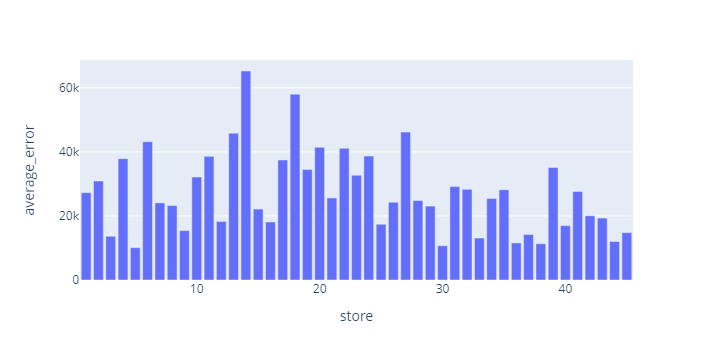

In [155]:
px.bar(test_sample_by_store, x='store', y='average_error')

#### Best and worst stores comparison

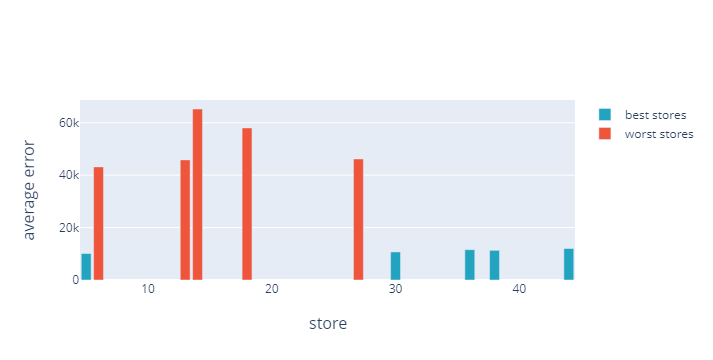

In [168]:
best_worst_fig = make_subplots(
    x_title='store',
    y_title='average error'
)
best_worst_fig.add_trace(
    go.Bar(
           x=best_stores['store'],
           y=best_stores['average_error'],
           name = 'best stores',
           marker = dict(color='rgb(34,163,192)')
          )
)
best_worst_fig.add_trace(
    go.Bar(
           x=worst_stores['store'],
           y=worst_stores['average_error'],
           name = 'worst stores',
          ),

)
best_worst_fig.show()

In [174]:
best_stores

,store,average_error,average_sales,average_prediction,average_temp,average_fuel_price,average_cpi,average_unemployment
4,5,10106.374474,315419.382105,321278.21875,67.115789,3.224211,3.224211,6.170842
29,30,10706.563831,440733.381290,438260.87500,67.753548,3.264742,3.264742,7.560548
37,38,11322.460286,387272.607143,389599.21875,66.412286,3.529657,3.529657,13.143543
35,36,11569.062500,368190.842857,364764.84375,72.787143,3.260886,3.260886,7.820429
43,44,12021.571216,306873.114865,311331.03125,56.275405,3.400000,3.400000,6.492162


#### What characterizes the best and worst performing stores?
As in what are their characteristic values, on average, how do the best and worst stores differ, in what areas

In [175]:
best_stores_avg = best_stores.mean()

In [176]:
best_stores_avg

store                       30.600000
average_error            11145.206461
average_sales           363697.865652
average_prediction      365046.843750
average_temp                66.068834
average_fuel_price           3.335899
average_cpi                  3.335899
average_unemployment         8.237505
dtype: float64

In [177]:
worst_stores_avg = worst_stores.mean()
worst_stores_avg

store                   1.560000e+01
average_error           5.169260e+04
average_sales           1.670876e+06
average_prediction      1.672463e+06
average_temp            5.952750e+01
average_fuel_price      3.394260e+00
average_cpi             3.394260e+00
average_unemployment    7.851085e+00
dtype: float64

In [178]:
best_worst_avg_diff = best_stores_avg - worst_stores_avg
best_worst_avg_diff

store                   1.500000e+01
average_error          -4.054740e+04
average_sales          -1.307178e+06
average_prediction     -1.307416e+06
average_temp            6.541331e+00
average_fuel_price     -5.836059e-02
average_cpi            -5.836059e-02
average_unemployment    3.864199e-01
dtype: float64

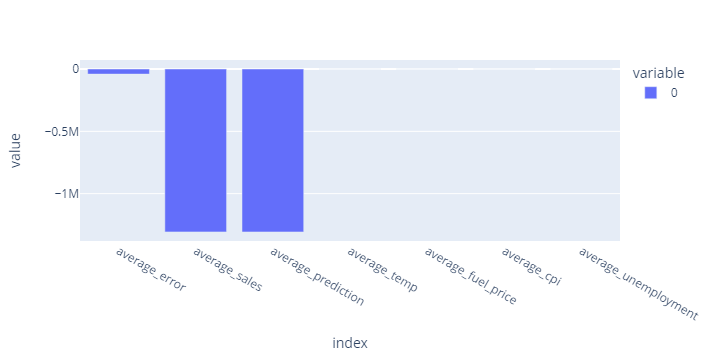

In [183]:
px.bar(best_worst_avg_diff.drop(['store']))

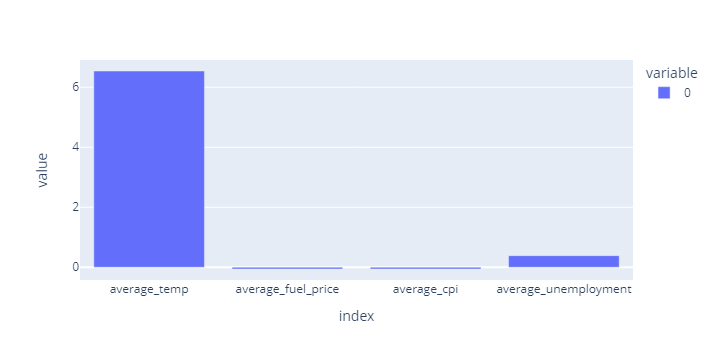

In [185]:
px.bar(best_worst_avg_diff.drop(['store', 'average_error', 'average_sales', 'average_prediction']))

It seems our model seems to perform better on stores from generally warmer regions. This could just be an error due to the sample chosen, but we don't want to predict on the whole dataset again, to avoid predicting on training data. Still, a difference of around 6 degrees seems hard to ignore.

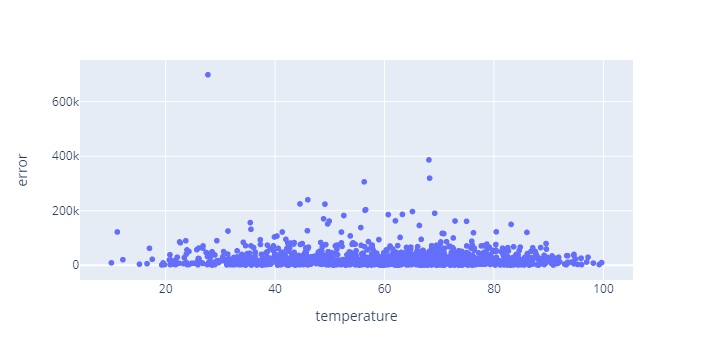

In [189]:
px.scatter(test_sample, x='temperature', y='error')

## Reasonings / Decisions made

### Why cross-validate
Clearly, there is some variance in the model's performance, based on the data sample - a model might perform exceptionally well on some portion of the dataset, while on average, while validating on the whole dataset, it perform a worse, even significantly. It's worth being aware of the worst case scenarios / the range of performance for any model, to accurately judge it's usefullness, especially in cases like the dataset uses, where the predicted variable and the factors used may vary significantly, based on the store / the region of the store.

### Standard scaling
One important issue models may run into while training, the user needs to be aware of is the scale of the values of the factors used. For example, for a region with many customers needing to drive to get to stores, a slight change in fuel price, might influence their decision more the change in the Consumer Price Index. But whereas a 100% increase for fuel prices would in some regions equal to approximately 2-3 dollars, a 100% CPI change, might revolve around a raw numerical value increase of 100 - even though the relative percentage change remained the same, the factor changed about 50 times more. With that in mind, it might prove useful to consider scaling all of the factors to a set range of values, let's say 0-1, so that the relationships of values within factors are kept, but no factor overshadows other.

In the case of the problem at hand, when factors come from relatively different domains standard scaling may be especially useful, because of the lack of domain relationship. If they came from similar domains, say the average price of fruit and the average price of appliances for that week, even if the scales of these factors were quite different, the relation between their values might be of interest to us and the model